Elaborado por Ulises González

Credit Card Fraud Prediction
Este conjunto de datos ofrece una variedad de atributos valiosos para un análisis exhaustivo. Contiene 555.719 instancias y 22 atributos, una combinación de tipos de datos categóricos y numéricos. Es importante destacar que el conjunto de datos está completo y no tiene valores nulos. Aquí hay un desglose de los atributos:

- Trans_date_trans_time: Marca de tiempo de la transacción (fecha y hora).
- Cc_num:Número único de identificación del cliente.
- Comerciante: El comerciante involucrado en la transacción.
- Categoría Tipo de transacción (por ejemplo, personal, cuidado de niños).
- Amt: Monto de la transacción. Nombre: nombre del titular de la tarjeta.
- Apellido del último titular de la tarjeta.
- Género: Género del titular de la tarjeta.
- Calle: Dirección postal del titular de la tarjeta.
- Ciudad: Ciudad de residencia del titular de la tarjeta.
- Estado: Estado de residencia del titular de la tarjeta.
- Zip: Código postal del titular de la tarjeta.
- Lat: Latitud de la ubicación del titular de la tarjeta.
- Largo: Longitud de la ubicación del titular de la tarjeta.
- City_pop: Población de la ciudad del titular de la tarjeta.
- Puesto: puesto de trabajo del titular de la tarjeta.
- Dob: Fecha de nacimiento del titular de la tarjeta.
- Trans_num: Identificador único de transacción.
- Unix_time: marca de tiempo de la transacción (formato Unix).
- Merch_lat: Ubicación del comerciante (latitud).
- Merch_long: Ubicación del comerciante (longitud).
- Is_fraud:Indicador de transacción fraudulenta (1 = fraude, 0 = legítimo). Esta es la variable objetivo a efectos de clasificación.

Fuente: https://www.kaggle.com/datasets/kelvinkelue/credit-card-fraud-prediction

In [2]:
#Importando los módulos principales

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import dataprep.eda as eda
import folium
from scipy.stats import norm

In [4]:
data = pd.read_csv('https://media.githubusercontent.com/media/gonzalezulises/lfsCreditCard/main/CreditCardFraudPrediction.csv') 
# El tamaño del archivo supera los 100 megas, por lo cual configure un GIT LFS, acá el repositorio: https://github.com/gonzalezulises/lfsCreditCard.git

In [5]:
data.head(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,21/06/2020 12:14,2.291160e+15,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,...,33.9659,-80.9355,333497,Mechanical engineer,19/03/1968,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,21/06/2020 12:14,3.573030e+15,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,...,40.3207,-110.4360,302,"Sales professional, IT",17/01/1990,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,21/06/2020 12:14,3.598220e+15,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,...,40.6729,-73.5365,34496,"Librarian, public",21/10/1970,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,21/06/2020 12:15,3.591920e+15,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,...,28.5697,-80.8191,54767,Set designer,25/07/1987,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,21/06/2020 12:15,3.526830e+15,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,...,44.2529,-85.0170,1126,Furniture designer,06/07/1955,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [6]:
data.dtypes

Unnamed: 0                 int64
trans_date_trans_time     object
cc_num                   float64
merchant                  object
category                  object
amt                      float64
first                     object
last                      object
gender                    object
street                    object
city                      object
state                     object
zip                        int64
lat                      float64
long                     float64
city_pop                   int64
job                       object
dob                       object
trans_num                 object
unix_time                  int64
merch_lat                float64
merch_long               float64
is_fraud                   int64
dtype: object

In [7]:
#Para esto voy a realizar un análisis exploratorio de los datos, de manera de entender la función y sus valores asociados. Para ello 
#voy a usar dataprep (https://dataprep.ai/) que es brutal para hacer profiling

100%|#########################################################################################################…

  0%|                                                                                                         …


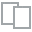
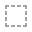
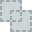
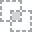
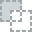
...
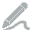
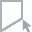
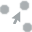
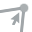
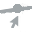

In [8]:
eda.plot( df = data)

Preguntas de análisis
- ¿Cuáles son las características comunes de las transacciones fraudulentas? (E.g., monto de la transacción, ubicación del comerciante, categoría de la transacción). (Para esta primera entrega voy a trabajar esta)
- ¿Existen diferencias significativas en el comportamiento de compra entre géneros?
- ¿Cómo varían las transacciones fraudulentas a lo largo del tiempo? (E.g., patrones diarios, mensuales o estacionales).
- ¿Hay correlación entre la ubicación del comerciante y la frecuencia de transacciones fraudulentas?
- ¿Cómo afecta la población de la ciudad al volumen y tipo de transacciones?

Hipótesis para probar ***A desarrollar para el proyecto final
- Las transacciones de montos más altos tienen una mayor probabilidad de ser fraudulentas.
- Las transacciones en ciertas categorías (como cuidado personal) son más susceptibles al fraude que otras.
- Los clientes de ciudades con poblaciones menores experimentan una tasa más alta de transacciones fraudulentas debido a menores medidas de seguridad.
- Las transacciones realizadas durante ciertos períodos del día son más propensas a ser fraudulentas.
- Los datos demográficos, como la edad y el género del titular de la tarjeta, influyen en la probabilidad de fraude.

a. Histograma de Montos de Transacciones

In [9]:
df_fraude = data[data['is_fraud'] == 1 ]

In [10]:
df_fraude.head(3)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
1685,1685,21/06/2020 22:06,3.560730e+15,fraud_Hamill-D'Amore,health_fitness,24.84,Brooke,Smith,F,63542 Luna Brook Apt. 012,...,31.8599,-102.7413,23,Cytogeneticist,15/09/1969,16bf2e46c54369a8eab2214649506425,1371852399,32.575873,-102.604290,1
1767,1767,21/06/2020 22:32,6.564460e+15,"fraud_Rodriguez, Yost and Jenkins",misc_net,780.52,Douglas,Willis,M,619 Jeremy Garden Apt. 681,...,42.5545,-90.3508,1306,Public relations officer,10/09/1958,ab4b379d2c0c9c667d46508d4e126d72,1371853942,42.461127,-91.147148,1
1781,1781,21/06/2020 22:37,6.564460e+15,fraud_Nienow PLC,entertainment,620.33,Douglas,Willis,M,619 Jeremy Garden Apt. 681,...,42.5545,-90.3508,1306,Public relations officer,10/09/1958,47a9987ae81d99f7832a54b29a77bf4b,1371854247,42.771834,-90.158365,1


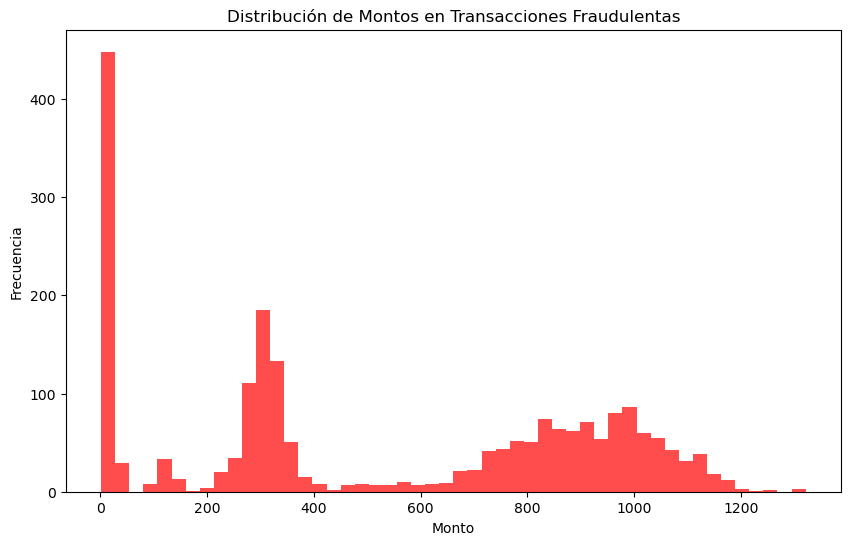

In [11]:

plt.figure(figsize=(10, 6))
plt.hist(df_fraude['amt'], bins=50, color='red', alpha=0.7)
plt.title('Distribución de Montos en Transacciones Fraudulentas')
plt.xlabel('Monto')
plt.ylabel('Frecuencia')
plt.show()


- Las barras indican el número de transacciones fraudulentas que cayeron dentro de cada rango de montos. Hay una concentración muy alta de transacciones con montos bajos cerca de 0, lo que sugiere que la mayoría de las transacciones fraudulentas involucran montos pequeños.
- La distribución tiene un sesgo hacia la izquierda (o es positivamente sesgada), con frecuencias decrecientes a medida que el monto aumenta. Esto es común en datos de transacciones financieras, donde las transacciones de montos más pequeños son mucho más numerosas que las de montos grandes.
- Hay picos secundarios en la gráfica, por ejemplo, uno notable alrededor de 200 unidades en el eje X. Esto podría indicar montos específicos que son comúnmente utilizados en transacciones fraudulentas.

In [12]:
m = folium.Map(tiles="cartodb positron")
m.save("footprint.html")

In [13]:
df_mapa_fraude = pd.DataFrame({
    'lon': df_fraude['merch_long'],
    'lat': df_fraude['merch_lat'],
    'city': df_fraude['city'],
    'state':df_fraude['state'],
    'amt': df_fraude['amt']
})
df_mapa_fraude

,lon,lat,city,state,amt
1685,-102.604290,32.575873,Notrees,TX,24.84
1767,-91.147148,42.461127,Benton,WI,780.52
1781,-90.158365,42.771834,Benton,WI,620.33
1784,-90.261595,31.204974,Denham Springs,LA,1077.69
1857,-102.736390,31.315782,Notrees,TX,842.65
...,...,...,...,...,...
517197,-89.911011,34.573471,Senatobia,MS,1041.51
517274,-90.390612,34.091227,Senatobia,MS,868.09
517341,-90.284780,34.628434,Senatobia,MS,1039.42
517529,-90.401093,34.746063,Senatobia,MS,289.27


In [14]:
# Creando un mapa base con Folium en la ubicación inicial deseada y con un nivel de zoom que se ajuste
m = folium.Map(location=[df_mapa_fraude['lat'].mean(), df_mapa_fraude['lon'].mean()], zoom_start=6)
for i in range(len(df_mapa_fraude)): #con esto añado los marcadores al mapa
    folium.Marker(
        location=[df_mapa_fraude.iloc[i]['lat'], df_mapa_fraude.iloc[i]['lon']],
        popup=f"{df_mapa_fraude.iloc[i]['city']}: ${df_mapa_fraude.iloc[i]['amt']}"
    ).add_to(m)

# Mostrar el mapa
m


In [15]:
#No me gusta el resultados, voy a crear un nuevo dataframe agrupando los valores de fraude por lugar

In [16]:
df_agrupado_por_ciudad = df_mapa_fraude.groupby('city', as_index=False).agg({
    'lat': 'mean',  
    'lon': 'mean',  
    'amt': 'sum' ,
})

# Mostramos el nuevo DataFrame agrupado
print(df_agrupado_por_ciudad)

           city        lat         lon      amt
0         Adams  43.651543  -89.477159  8118.71
1         Afton  45.288029  -84.342338  3959.95
2         Akron  40.748093  -81.392258  7182.18
3     Allentown  32.947180  -83.064024  7934.88
4       Andrews  40.572648  -85.763330  1002.07
..          ...        ...         ...      ...
210  Whittemore  43.029393  -94.357829  6515.12
211    Williams  38.938819  -87.053013  6805.61
212      Wilton  47.304185 -100.965209  5895.06
213   Woodville  34.432984  -85.934894  2194.65
214     Zavalla  30.780026  -94.343175  6601.45

[215 rows x 4 columns]


In [17]:
#Aca me doy soporte con ChatGPT v4.0, ya que estoy descubriendo folium

m = folium.Map(location=[df_agrupado_por_ciudad['lat'].mean(), df_agrupado_por_ciudad['lon'].mean()], zoom_start=5)
min_amount = df_agrupado_por_ciudad['amt'].min()
max_amount = df_agrupado_por_ciudad['amt'].max()
min_radius = 5
max_radius = 50

for _, row in df_agrupado_por_ciudad.iterrows():
    # Escalando el monto para que esté dentro del rango de los radios
    scaled_radius = (row['amt'] - min_amount) / (max_amount - min_amount) * (max_radius - min_radius) + min_radius
    
    # Creando un CircleMarker
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=scaled_radius,  # El radio es una función del monto 'amt'
        color='blue',
        fill=True,
        fill_color='blue',
        popup=f"{row['city']}: ${row['amt']}"
    ).add_to(m)
m


In [18]:
#No me funciona, voy a agrupar por la variable "State"

In [19]:
df_agrupado_por_estado = df_mapa_fraude.groupby('state', as_index=False).agg({
    'lat': 'mean',  
    'lon': 'mean',  
    'amt': 'sum'    
})
print(df_agrupado_por_estado)


   state        lat         lon       amt
0     AK  55.432806 -133.028497  11641.22
1     AL  32.706312  -86.767262  36474.51
2     AR  35.591582  -92.969613  16605.22
3     AZ  33.498572 -112.213427  14119.83
4     CA  36.212457 -119.937043  34995.06
5     CO  39.673001 -104.817054    150.04
6     CT  41.680095  -72.780689  17977.25
7     DC  39.101818  -76.930992   6640.64
8     FL  28.734110  -82.968836  22734.52
9     GA  32.124854  -83.399697  33619.50
10    HI  20.167208 -155.648136   6164.72
11    IA  41.809060  -93.213834  34808.15
12    ID  45.053348 -115.081530  10548.17
13    IL  40.339402  -89.405058  35657.45
14    IN  39.552824  -86.364183  34953.10
15    KS  38.872652  -97.876094  24870.42
16    KY  37.623277  -85.468882  42175.29
17    LA  30.514724  -90.873535  10249.12
18    MA  41.970681  -72.714651   6600.80
19    MD  39.131267  -77.020757  25470.69
20    ME  44.516800  -69.011901   9152.98
21    MI  43.709096  -84.265360  37753.48
22    MN  45.875844  -95.054465  3

In [20]:
#ya entiendo como funciona, acá sigo la receta anterior que me brindó la IA
m = folium.Map(location=[df_agrupado_por_estado['lat'].mean(), df_agrupado_por_estado['lon'].mean()], zoom_start=4)
min_radius = 5
max_radius = 50
min_amt = df_agrupado_por_estado['amt'].min()
max_amt = df_agrupado_por_estado['amt'].max()

for index, row in df_agrupado_por_estado.iterrows():
    if max_amt != min_amt: 
        scaled_radius = (row['amt'] - min_amt) / (max_amt - min_amt) * (max_radius - min_radius) + min_radius
    else:
        scaled_radius = max_radius
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=scaled_radius,
        color='red',
        fill=True,
        fill_color='pink',
        popup=f"{row['state']}: ${row['amt']}"
    ).add_to(m)
m


Conclusiones preliminares:
- Parece haber una mayor concentración de transacciones fraudulentas, o al menos de montos más grandes de transacciones fraudulentas, en la parte este de los Estados Unidos. Es notable la concentración alrededor de la región del Atlántico Medio y el Noreste.
- Algunos estados tienen círculos relativamente pequeños, lo que sugiere que el número o el monto de las transacciones fraudulentas en esos lugares es menor en comparación con otros estados. Esto podría deberse a diferentes factores, como una menor población, menos actividad comercial o mejores medidas de prevención del fraude.
- Algunos de los círculos más grandes están ubicados cerca de lo que parecen ser importantes centros urbanos, como Los Ángeles y Nueva York. Esto podría indicar que hay una correlación entre la actividad de fraude y la densidad de población o el volumen de transacciones comerciales.

In [21]:
#Evaluando a los merchant

In [22]:
df_fraude.head(3)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
1685,1685,21/06/2020 22:06,3.560730e+15,fraud_Hamill-D'Amore,health_fitness,24.84,Brooke,Smith,F,63542 Luna Brook Apt. 012,...,31.8599,-102.7413,23,Cytogeneticist,15/09/1969,16bf2e46c54369a8eab2214649506425,1371852399,32.575873,-102.604290,1
1767,1767,21/06/2020 22:32,6.564460e+15,"fraud_Rodriguez, Yost and Jenkins",misc_net,780.52,Douglas,Willis,M,619 Jeremy Garden Apt. 681,...,42.5545,-90.3508,1306,Public relations officer,10/09/1958,ab4b379d2c0c9c667d46508d4e126d72,1371853942,42.461127,-91.147148,1
1781,1781,21/06/2020 22:37,6.564460e+15,fraud_Nienow PLC,entertainment,620.33,Douglas,Willis,M,619 Jeremy Garden Apt. 681,...,42.5545,-90.3508,1306,Public relations officer,10/09/1958,47a9987ae81d99f7832a54b29a77bf4b,1371854247,42.771834,-90.158365,1


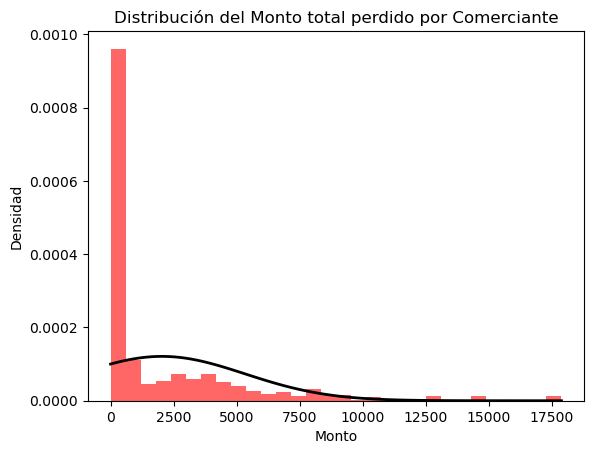

In [23]:
merchant_sums = df_fraude.groupby('merchant')['amt'].sum() #analizando los vendedores por montos
mean_amt = merchant_sums.mean()
std_amt = merchant_sums.std()
xmin, xmax = merchant_sums.min(), merchant_sums.max()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean_amt, std_amt)
plt.hist(merchant_sums, bins=30, density=True, alpha=0.6, color='red')
plt.plot(x, p, 'k', linewidth=2)

title_text = 'Distribución del Monto total perdido por Comerciante'
plt.title(title_text)
plt.xlabel('Monto')
plt.ylabel('Densidad')
plt.show()

In [24]:
#haciendo zoom al monto, hay una concentración gigante entre 0 y 2500

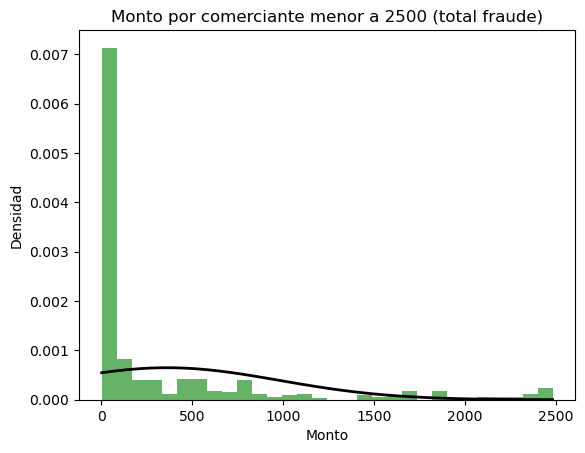

In [25]:
merchant_sums = df_fraude.groupby('merchant')['amt'].sum().reset_index()
filtered_merchant_sums = merchant_sums[merchant_sums['amt'] <= 2500]['amt']
mean_amt = filtered_merchant_sums.mean()
std_amt = filtered_merchant_sums.std()
xmin, xmax = filtered_merchant_sums.min(), filtered_merchant_sums.max()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean_amt, std_amt)
plt.hist(filtered_merchant_sums, bins=30, density=True, alpha=0.6, color='g')
plt.plot(x, p, 'k', linewidth=2)

title_text = 'Monto por comerciante menor a 2500 (total fraude)'
plt.title(title_text)
plt.xlabel('Monto')
plt.ylabel('Densidad')

# Mostrar la gráfica
plt.show()


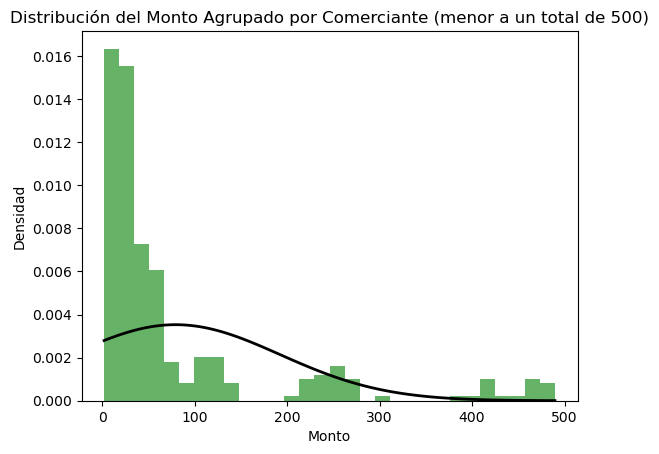

In [31]:
merchant_sums = df_fraude.groupby('merchant')['amt'].sum().reset_index()
filtered_merchant_sums = merchant_sums[merchant_sums['amt'] <= 500]['amt']
mean_amt = filtered_merchant_sums.mean()
std_amt = filtered_merchant_sums.std()
xmin, xmax = filtered_merchant_sums.min(), filtered_merchant_sums.max()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean_amt, std_amt)
plt.hist(filtered_merchant_sums, bins=30, density=True, alpha=0.6, color='g')
plt.plot(x, p, 'k', linewidth=2)
title_text = 'Distribución del Monto Agrupado por Comerciante (menor a un total de 500)'
plt.title(title_text)
plt.xlabel('Monto')
plt.ylabel('Densidad')
plt.show()


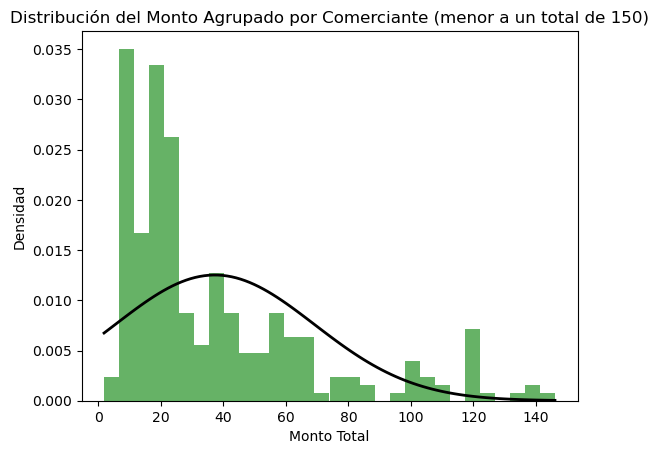

In [32]:
merchant_sums = df_fraude.groupby('merchant')['amt'].sum().reset_index()
filtered_merchant_sums = merchant_sums[merchant_sums['amt'] <= 150]['amt']
mean_amt = filtered_merchant_sums.mean()
std_amt = filtered_merchant_sums.std()
xmin, xmax = filtered_merchant_sums.min(), filtered_merchant_sums.max()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean_amt, std_amt)
plt.hist(filtered_merchant_sums, bins=30, density=True, alpha=0.6, color='g')
plt.plot(x, p, 'k', linewidth=2)
title_text = 'Distribución del Monto Agrupado por Comerciante (menor a un total de 150)'
plt.title(title_text)
plt.xlabel('Monto Total')
plt.ylabel('Densidad')
plt.show()


In [28]:
#voy a cambiar a un histograma acumulado para entender el % 

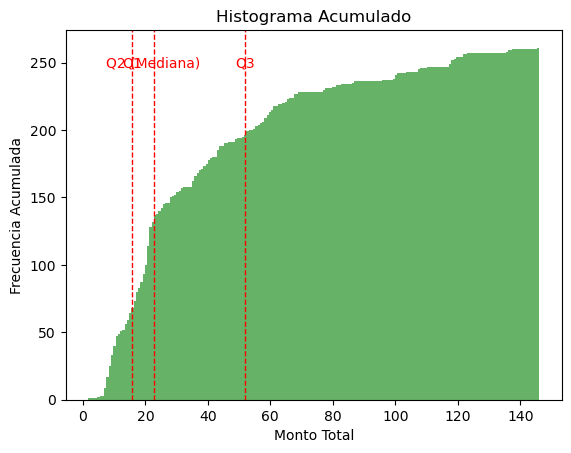

In [29]:
merchant_sums = df_fraude.groupby('merchant')['amt'].sum().reset_index()
filtered_merchant_sums = merchant_sums[merchant_sums['amt'] <= 150]['amt']
quartiles = np.percentile(filtered_merchant_sums, [25, 50, 75])
plt.hist(filtered_merchant_sums, bins=200, cumulative=True, alpha=0.6, color='g')
for quartile in quartiles:
    plt.axvline(quartile, color='r', linestyle='dashed', linewidth=1)
plt.text(quartiles[0], plt.gca().get_ylim()[1]*0.9, "Q1", horizontalalignment='center', color='red')
plt.text(quartiles[1], plt.gca().get_ylim()[1]*0.9, "Q2 (Mediana)", horizontalalignment='center', color='red')
plt.text(quartiles[2], plt.gca().get_ylim()[1]*0.9, "Q3", horizontalalignment='center', color='red')
plt.title('Histograma Acumulado')
plt.xlabel('Monto Total')
plt.ylabel('Frecuencia Acumulada')
plt.show()

Análisis inicial
- La mayoría de los montos agrupados por comerciante son relativamente bajos, dado que la mediana (Q2) está cerca del 20, y el Q3 no está muy lejos del Q2, indicando que el 75% de los comerciantes tiene montos de fraude que se acumulan hasta aproximadamente 40 o menos. Esto podría indicar que los fraudes más significativos (en términos de monto) son cometidos por un número menor de comerciantes.
- Dado que Q3 está más cerca de Q2 que de Q1 (no se muestra por lo que debe estar muy cerca del 0), la distribución parece estar sesgada hacia la izquierda, lo que indica que hay unos pocos casos con montos de fraude muy altos, mientras que la mayoría de los comerciantes tienen montos de fraude menores.
- El histograma sube rápidamente al principio y luego se aplana, lo que sugiere que hay un pequeño número de comerciantes con montos de fraude muy altos que contribuyen significativamente al monto total de fraude